# AudioSet models
Single predictor models using AudioSet regressors for auditory object recognition

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
from tools.create import create_single_models
from tools.base import (dump_collection, load_collection, 
                        flatten_collection, compute_metrics,
                        _extract_regressors)
from tools.viz import (plot_regressor, plot_regressor,
                       plot_metrics, plot_contrast_by_dataset, plot_contrast_by_analysis,
                       plot_analysis_grid)
from pyns import Neuroscout
import numpy as np
from matplotlib import pyplot as plt
from pathlib import Path
%matplotlib inline

Set up API

In [3]:
api = Neuroscout()

## Define predictors and confounds

In [4]:
predictors = ["as-Animal", "as-Music", "as-Whistling", "as-Vehicle", "as-Silence", "as-Tools", "as-Noise", "as-Water", "as-Wind", "as-Hands", "as-Wood"]

In [5]:
confounds = ['a_comp_cor_00', 'a_comp_cor_01', 'a_comp_cor_02', 'a_comp_cor_03', 'a_comp_cor_04', 'a_comp_cor_05',  'trans_x', 'trans_y', 'trans_z', 'rot_x', 'rot_y', 'rot_z']

## Create models

In [6]:
#single_models = create_single_models(predictors, confounds)

In [6]:
filename = Path('models') / 'audioset_single.json'

In [20]:
dump_collection(single_models, filename)

In [7]:
single_models = load_collection('models/audioset_single.json')

### Reports

In [7]:
for (pred, dataset, task), model in flatten_collection(single_models):
    model.generate_report(run_id=model.runs[0])

In [8]:
for p in predictors:
    single_models[p]['Budapest']['movie'].plot_report()

## Inspect regressors

In [7]:
df = _extract_regressors(single_models, datasets=['Sherlock'])

In [ ]:
plot_regressor('distribution', df=df, split_by='hue', color=None, aspect=3, hist=None, rug=True)

In [ ]:
plot_regressor('timeseries', df=df, split_by='row', height=1.2, aspect=10)

In [23]:
agg_df = compute_metrics(df=df, aggfunc=[np.mean, np.std, np.var])

In [ ]:
plot_metrics(agg_df, metrics=['mean', 'std', 'var'],
             sns_function='barplot', height=3, aspect=1)

## Compile models

In [23]:
for (pred, dataset, task), model in flatten_collection(single_models):
    if model.get_status()['status'] == 'DRAFT':
        model.private = False
        model.push()
        model.compile()
    else:
        print(f'Status: {model.status} for {pred}, {dataset}, {task}')

Status: PASSED for as-Animal, Budapest, movie
Status: PASSED for as-Animal, HealthyBrainNetwork, movieDM
Status: PASSED for as-Animal, LearningTemporalStructure, movie
Status: PASSED for as-Animal, Life, life
Status: PASSED for as-Animal, ParanoiaStory, story
Status: PASSED for as-Animal, Raiders, raiders
Status: PASSED for as-Animal, SchematicNarrative, perception
Status: PASSED for as-Animal, Sherlock, sherlockPart1
Status: PASSED for as-Animal, SherlockMerlin, MerlinMovie
Status: PASSED for as-Animal, SherlockMerlin, SherlockMovie
Status: PASSED for as-Animal, studyforrest, movie
Status: PASSED for as-Hands, Budapest, movie
Status: PASSED for as-Hands, HealthyBrainNetwork, movieDM
Status: PASSED for as-Hands, LearningTemporalStructure, movie
Status: PASSED for as-Hands, Life, life
Status: PASSED for as-Hands, ParanoiaStory, story
Status: PASSED for as-Hands, Raiders, raiders
Status: PASSED for as-Hands, SchematicNarrative, perception
Status: PASSED for as-Hands, Sherlock, sherlockPa

In [24]:
' '.join([m.hash_id for (pred, dataset, task), m in flatten_collection(single_models)])

'wJ3R4 AVjGa AqQXb AbqJV Mnk8j MXjaK A13b6 wWyqr 9EdD0 MGvZl wOO1d ArqpO 9Bqdl M8v2Z wK2E6 AopGD w0g4B MD1V7 ArqO1 MzQaq AdR3R wQD7R M37Oo Ma4J4 9eyD6 wkVz4 M4jaG 97p7e wjNrP A25GL MNQyN M55j6 9L2Zp w0g8X AbqoD 97pJd MGvXQ AqQaq 9Ed1O MnkEO Ma4K3 wjNX3 9L2Gr wWy6R MD1ed A6oLX w0gWB M37qj AYyZJ wJ3ZW wl8dz 9BqZl MD1Z7 wQDZR AxBaa wQDBd wK2p6 MXjlV AdRzR M8v3Z MzQyq Aop1D AVj54 A132n wOOjY Arqj1 9BqN5 AxBab Aop1a 9BqZ7 MD1Z4 AYyZb wJ3Zm wQDZz w0gWN wK2p5 M37q8 wK26p wkVbJ MpDq3 M55lX 9eydz MNQaL M4j65 AZ4Ja Mv345 Mm3Wq A25N3 AYyde AZ4Z1 wl8dX wy2P0 MRaZg MpDOK Mv3G7 wgy0R MPqZE A6oLQ Mm38x AopZG wy25Z AYyxJ A6oxX wl8nz MPqLa MRakG AxBNa wJ3WW M375j wgyVz MzQYZ AVja4 AqQ1q AbqxD MnkdO MXjLV A13qn wWyjR 9EdPO MGvoQ wOOXY'

## Results

In [8]:
flat_models = flatten_collection(single_models)

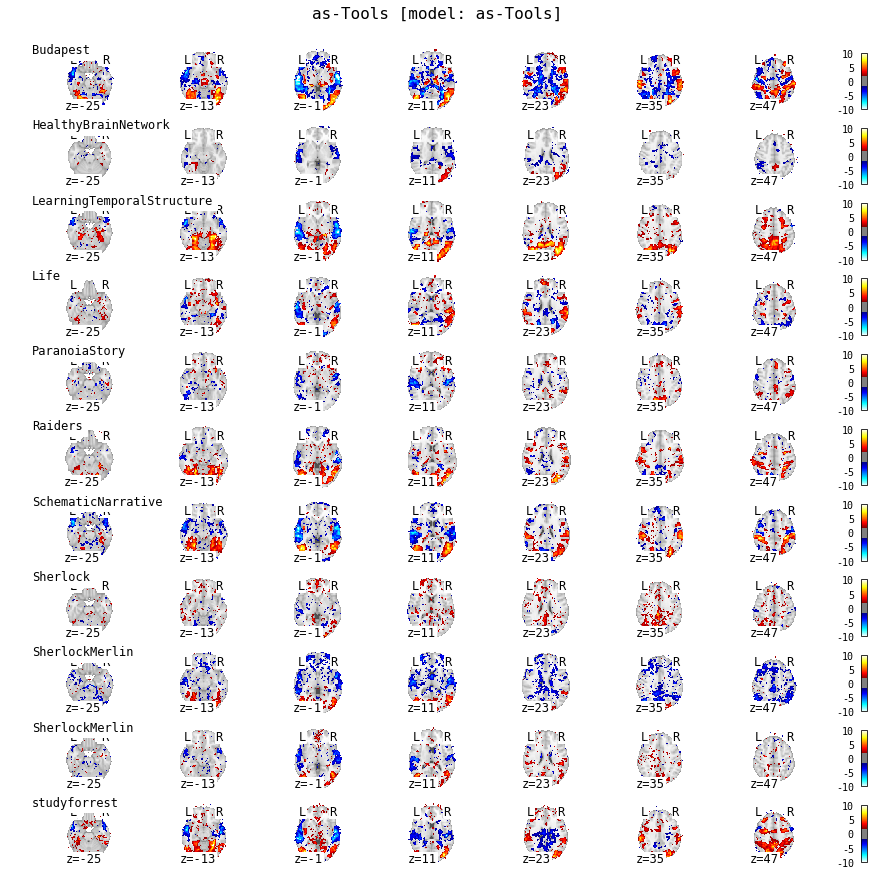

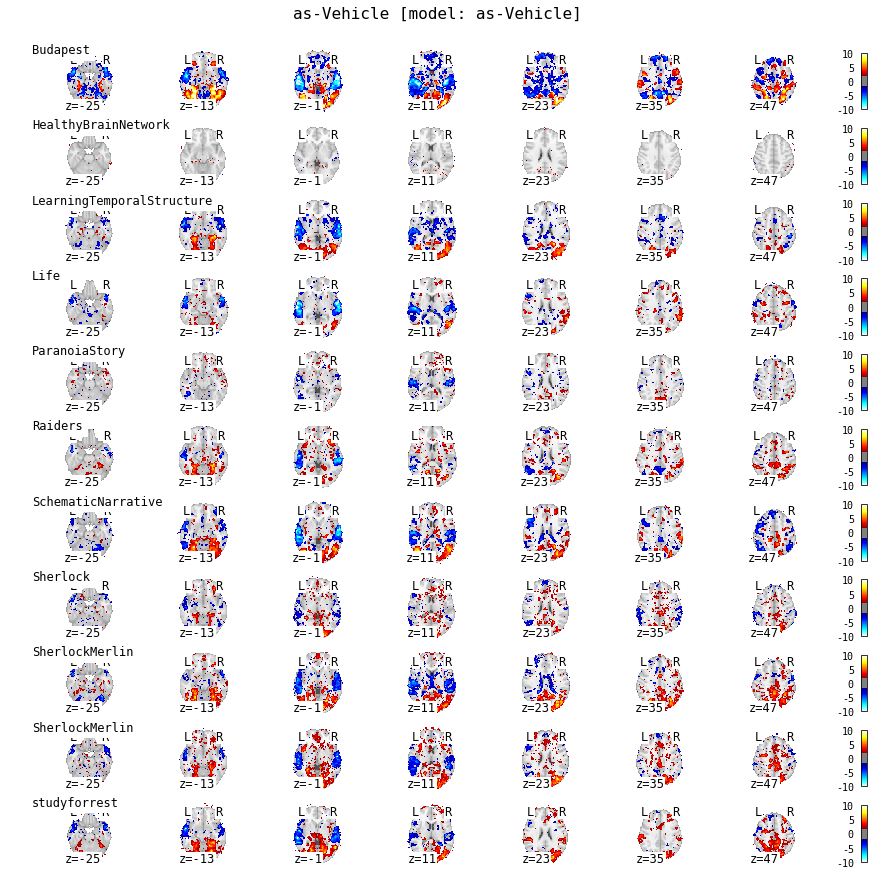

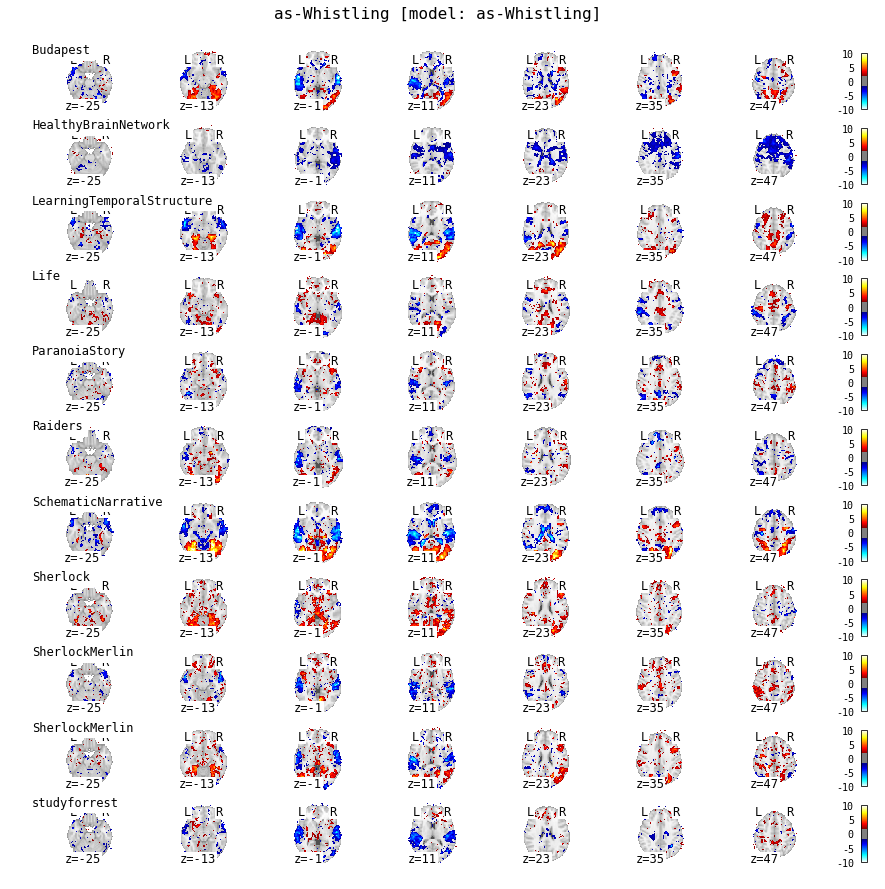

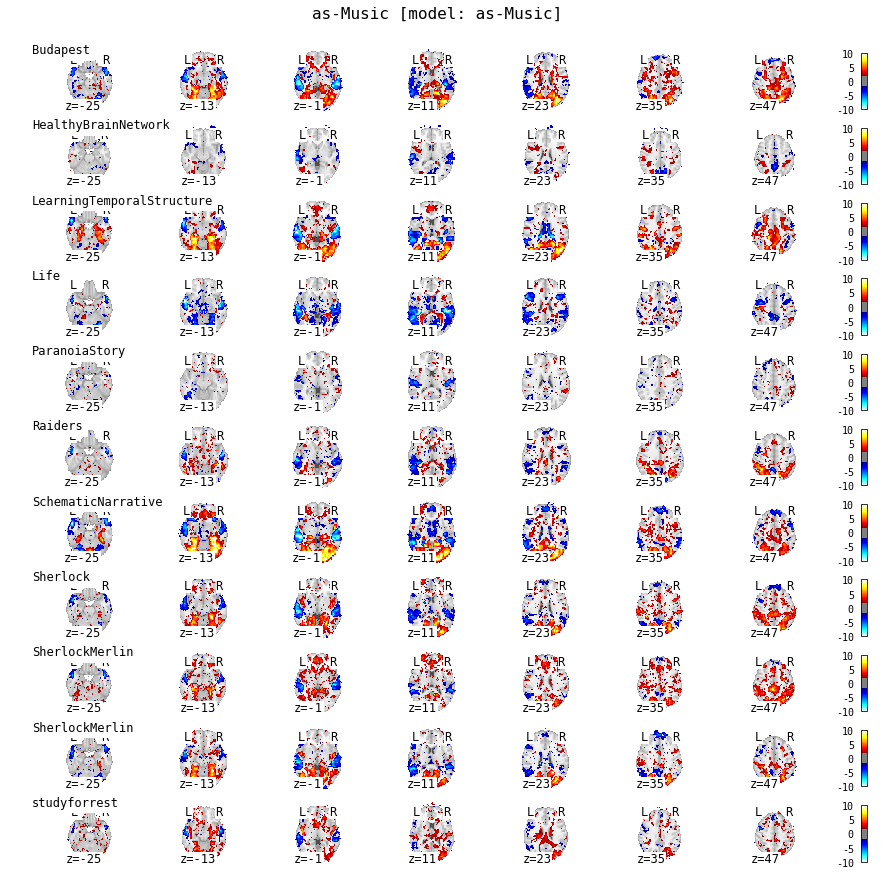

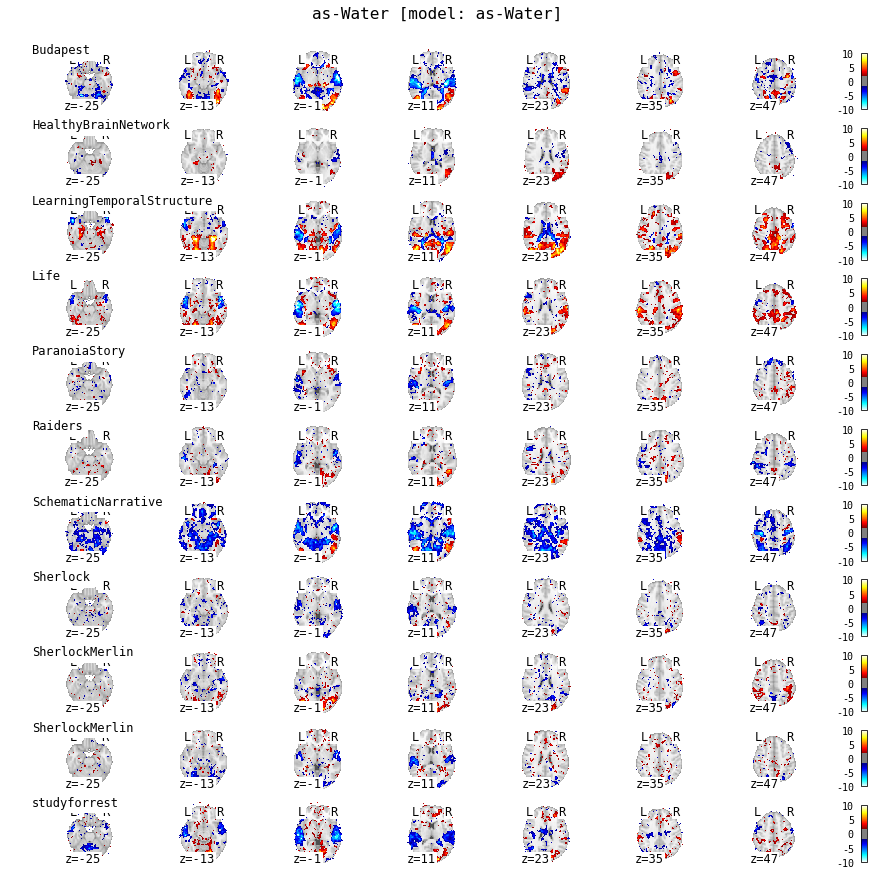

...

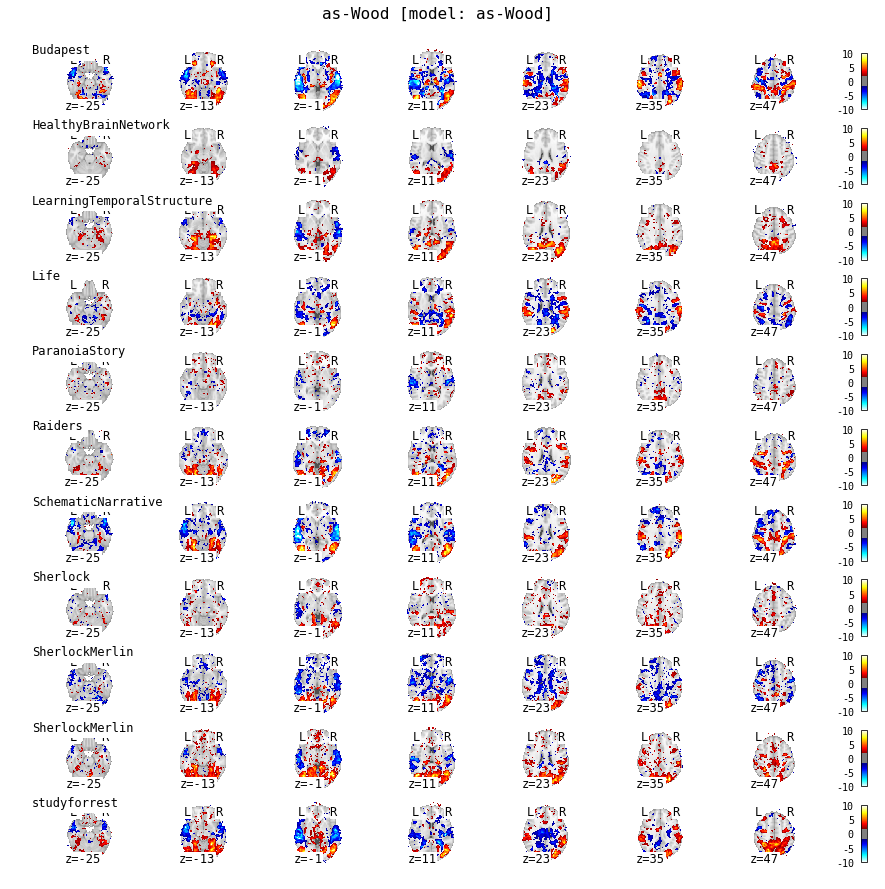

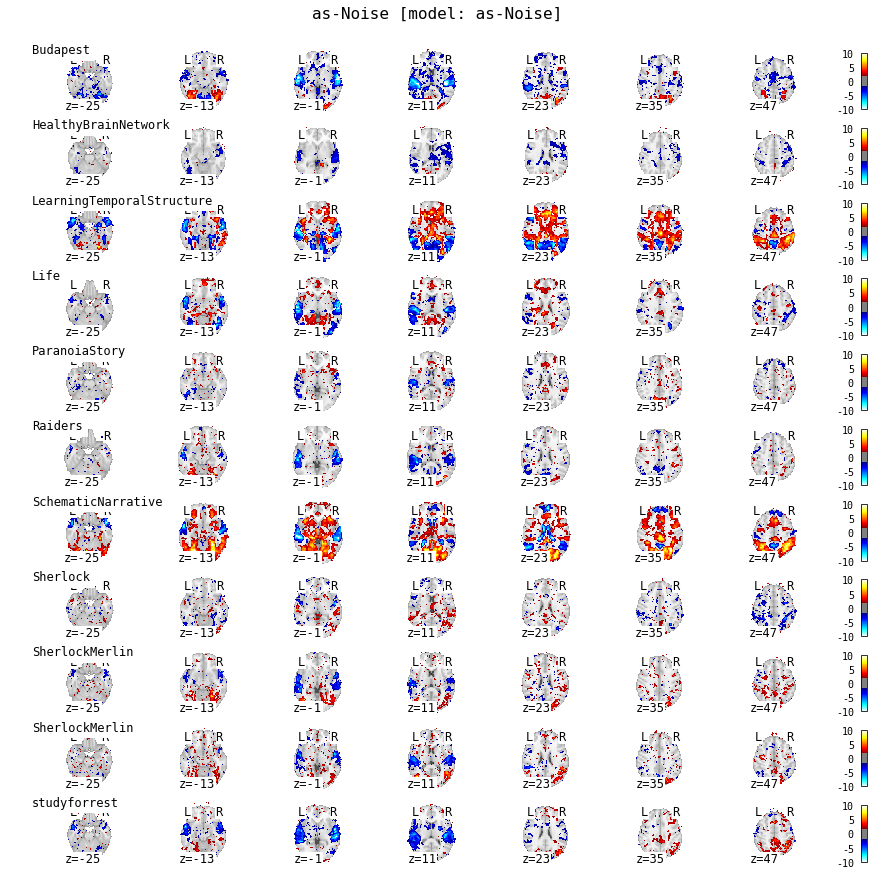

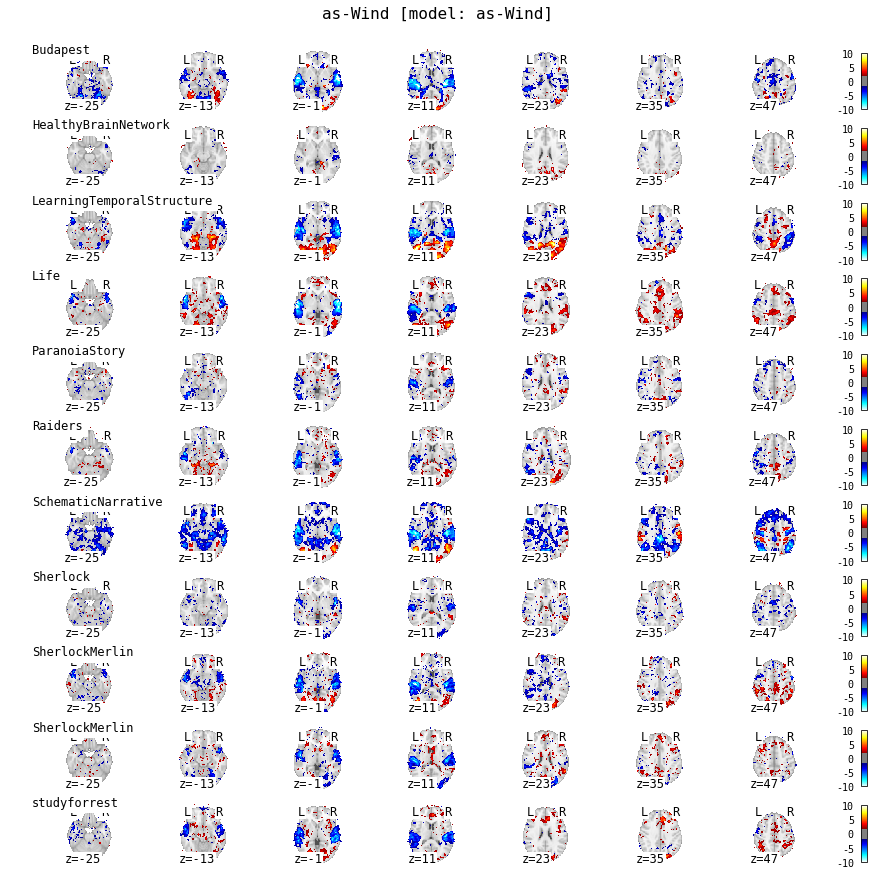

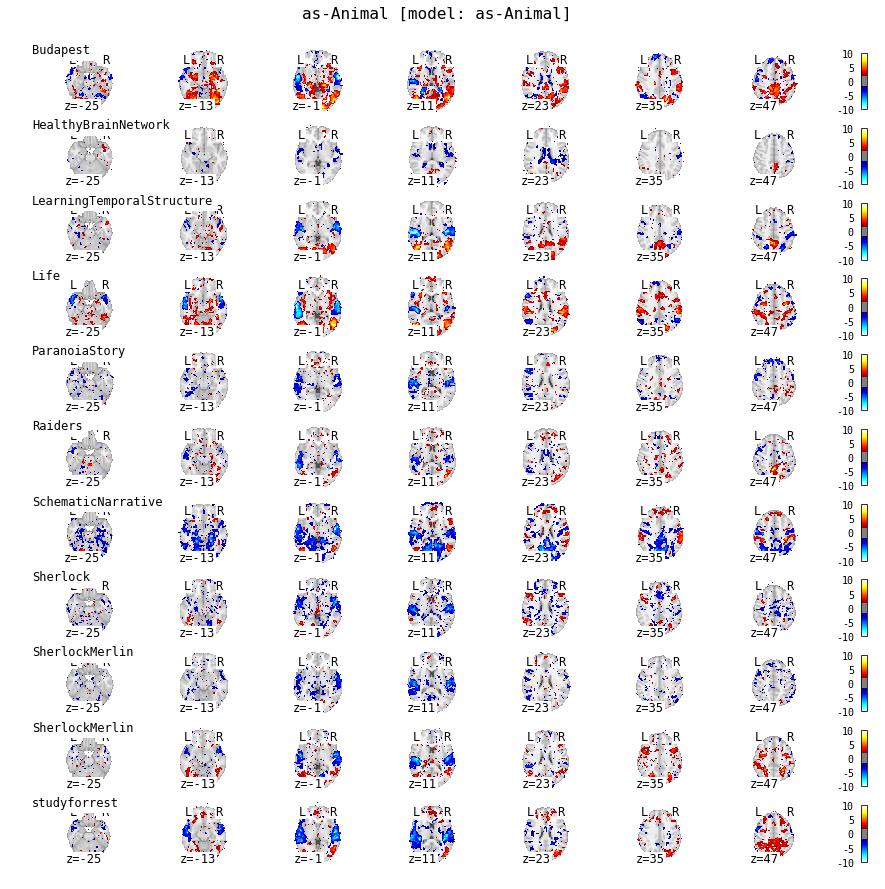

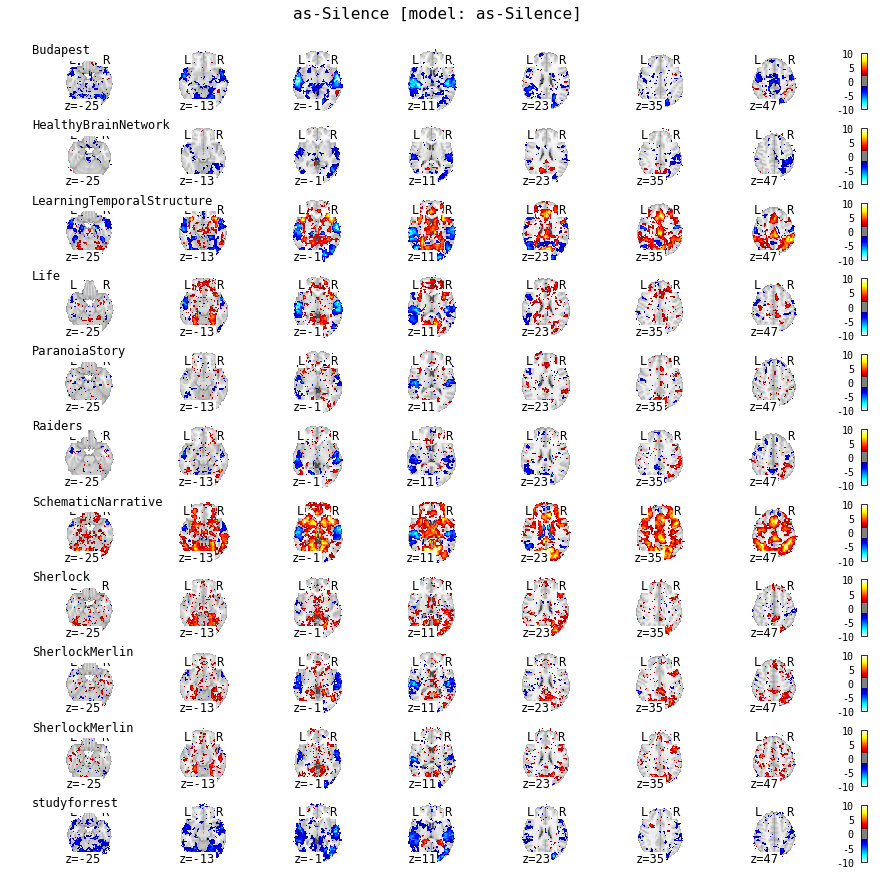

In [9]:
plt.rcParams.update({'font.family': 'monospace'})
plot_contrast_by_analysis(flat_models,
                          vmax=10, draw_cross=True, 
                          figsize=(15,15), colorbar=True, threshold=1.96)